In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression, LassoCV, RidgeCV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
from sklearn.metrics import r2_score
import re
%matplotlib inline

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer


from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [2]:
#read in the nba and epl csv files
nba = pd.read_csv('../datasets/nba.csv')
epl = pd.read_csv('../datasets/epl.csv')

In [3]:
nba.head()

,kind,data
0,t3,"{'approved_at_utc': None, 'subreddit': 'nba', ..."
1,t3,"{'approved_at_utc': None, 'subreddit': 'nba', ..."
2,t3,"{'approved_at_utc': None, 'subreddit': 'nba', ..."
3,t3,"{'approved_at_utc': None, 'subreddit': 'nba', ..."
4,t3,"{'approved_at_utc': None, 'subreddit': 'nba', ..."


In [4]:
epl.head()

,kind,data
0,t3,"{'approved_at_utc': None, 'subreddit': 'Premie..."
1,t3,"{'approved_at_utc': None, 'subreddit': 'Premie..."
2,t3,"{'approved_at_utc': None, 'subreddit': 'Premie..."
3,t3,"{'approved_at_utc': None, 'subreddit': 'Premie..."
4,t3,"{'approved_at_utc': None, 'subreddit': 'Premie..."


## Data cleaning: Initial check


### Cleaning NBA data

In [5]:
my_dict = nba['data']

In [6]:
list(my_dict)

['{\'approved_at_utc\': None, \'subreddit\': \'nba\', \'selftext\': \'# Game Threads Index (January 07, 2021):\\n\\n|Tip-off|GDT|Away||Home|Status|PGT|\\n|:--|:-:|:--|:-:|:--|--:|:-:|\\n|7:30 PM ET|[Philadelphia 76ers](/r/sixers)|&gt;!109 to 122!&lt;|[Brooklyn Nets](/r/gonets)|FINAL|[Link](https://www.reddit.com/r/nba/comments/ksprq4/game_thread_philadelphia_76ers_71_brooklyn_nets/)|[Link](https://www.reddit.com/r/nba/comments/kstkki/post_game_thread_the_brooklyn_nets_54_defeat_the/)|\\n|8:00 PM ET|[Cleveland Cavaliers](/r/clevelandcavs)|&gt;!94 to 90!&lt;|[Memphis Grizzlies](/r/memphisgrizzlies)|FINAL|[Link](https://www.reddit.com/r/nba/comments/ksqcpk/game_thread_cleveland_cavaliers_44_memphis/)|[Link](https://www.reddit.com/r/nba/comments/kstun0/post_game_thread_the_cleveland_cavaliers_54/)|\\n|10:00 PM ET|[Dallas Mavericks](/r/mavericks)|&gt;!124 to 117!&lt;|[Denver Nuggets](/r/denvernuggets)|FINAL-OT|[Link](https://www.reddit.com/r/nba/comments/kssj8r/game_thread_dallas_mavericks_

In [7]:
test = nba['data'].map(eval)
#convert the strings into actual dictionaries

In [8]:
df =pd.DataFrame(test)
#convert test into dataframe

In [9]:
df

,data
0,"{'approved_at_utc': None, 'subreddit': 'nba', ..."
1,"{'approved_at_utc': None, 'subreddit': 'nba', ..."
2,"{'approved_at_utc': None, 'subreddit': 'nba', ..."
3,"{'approved_at_utc': None, 'subreddit': 'nba', ..."
4,"{'approved_at_utc': None, 'subreddit': 'nba', ..."
...,...
3513,"{'approved_at_utc': None, 'subreddit': 'nba', ..."
3514,"{'approved_at_utc': None, 'subreddit': 'nba', ..."
3515,"{'approved_at_utc': None, 'subreddit': 'nba', ..."
3516,"{'approved_at_utc': None, 'subreddit': 'nba', ..."


In [10]:
nba_formatted = df['data'].apply(pd.Series)
#we split the dictionary within the dataframe into separate columns

In [11]:
pd.set_option('display.max_columns', None)
nba_formatted.head()
#show the max column

,approved_at_utc,subreddit,selftext,author_fullname,saved,mod_reason_title,gilded,clicked,title,link_flair_richtext,subreddit_name_prefixed,hidden,pwls,link_flair_css_class,downs,thumbnail_height,top_awarded_type,hide_score,name,quarantine,link_flair_text_color,upvote_ratio,author_flair_background_color,subreddit_type,ups,total_awards_received,media_embed,thumbnail_width,author_flair_template_id,is_original_content,user_reports,secure_media,is_reddit_media_domain,is_meta,category,secure_media_embed,link_flair_text,can_mod_post,score,approved_by,author_premium,thumbnail,edited,author_flair_css_class,author_flair_richtext,gildings,content_categories,is_self,mod_note,created,link_flair_type,wls,removed_by_category,banned_by,author_flair_type,domain,allow_live_comments,selftext_html,likes,suggested_sort,banned_at_utc,view_count,archived,no_follow,is_crosspostable,pinned,over_18,all_awardings,awarders,media_only,link_flair_template_id,can_gild,spoiler,locked,author_flair_text,treatment_tags,visited,removed_by,num_reports,distinguished,subreddit_id,mod_reason_by,removal_reason,link_flair_background_color,id,is_robot_indexable,report_reasons,author,discussion_type,num_comments,send_replies,whitelist_status,contest_mode,mod_reports,author_patreon_flair,author_flair_text_color,permalink,parent_whitelist_status,stickied,url,subreddit_subscribers,created_utc,num_crossposts,media,is_video,post_hint,url_overridden_by_dest,preview,crosspost_parent_list,crosspost_parent,author_cakeday
0,None,nba,"# Game Threads Index (January 07, 2021):\n\n|T...",t2_6vjwa,False,None,0,False,Trash Talk Thursday + Game Thread Index,"[{'e': 'text', 't': 'Index Thread'}]",r/nba,False,6,index,0,NaN,None,False,t3_kscsbd,False,light,0.92,,public,66,0,{},NaN,None,False,[],None,False,False,None,{},Index Thread,False,66,None,True,self,1.61009e+09,NBA,"[{'e': 'text', 't': '[NBA] Scott Foster'}]",{},None,True,None,1.610053e+09,richtext,6,None,None,richtext,self.nba,True,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",None,None,None,None,False,False,False,False,False,[],[],False,0a662acc-0504-11e8-a550-0e84efa39ed0,False,False,False,[NBA] Scott Foster,[],False,None,None,None,t5_2qo4s,None,None,#0079d3,kscsbd,True,None,NBA_MOD,None,47,False,all_ads,False,[],False,dark,/r/nba/comments/kscsbd/trash_talk_thursday_gam...,all_ads,True,https://www.reddit.com/r/nba/comments/kscsbd/t...,3764724,1.610024e+09,0,None,False,NaN,NaN,NaN,NaN,NaN,NaN
1,None,nba,"Here is a place to have in depth, x's and o's,...",t2_6vjwa,False,None,0,False,[SERIOUS NEXT DAY THREAD] Post-Game Discussion...,"[{'e': 'text', 't': 'Discussion'}]",r/nba,False,6,discussion,0,NaN,None,False,t3_ksbvwz,False,light,0.89,,public,80,1,{},NaN,None,False,[],None,False,False,None,{},Discussion,False,80,None,True,self,1.61004e+09,NBA,"[{'e': 'text', 't': '[NBA] Scott Foster'}]",{'gid_1': 1},None,True,None,1.610050e+09,richtext,6,None,None,richtext,self.nba,True,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",None,None,None,None,False,False,False,False,False,"[{'giver_coin_reward': None, 'subreddit_id': N...",[],False,e454879a-ff45-11ea-b58e-0ea6879ad6a7,False,False,False,[NBA] Scott Foster,[],False,None,None,moderator,t5_2qo4s,None,None,#0079d3,ksbvwz,True,None,NBA_MOD,None,74,False,all_ads,False,[],False,dark,/r/nba/comments/ksbvwz/serious_next_day_thread...,all_ads,True,https://www.reddit.com/r/nba/comments/ksbvwz/s...,3764724,1.610021e+09,0,None,False,NaN,NaN,NaN,NaN,NaN,NaN
2,None,nba,,t2_1w89454,False,None,0,False,"Chuck: ""I sat and watched, and I was in shock....",[],r/nba,False,6,None,0,78.0,None,False,t3_ksrbfv,False,dark,0.94,,public,6751,3,"{'content': '&lt;iframe class=""embedly-embed"" ...",140.0,None,False,[],{'oembed': {'provider_url': 'https://streamabl...,False,False,None,"{'content': '&lt;iframe class=""embedly-embed"" ...",None,False,6751,None,True,https://b.thumbs.redditmedia.com/0ANGu4Sku4QFb...,False,Mavs4,"[{'e': 'text', 't': '[DAL] Wang Zhizhi'}]",{'gid_1': 1},None,False,None,1.610096

In [12]:
#export the nba_formatted dataset
nba_formatted.to_csv('../datasets/nba_formatted.csv', index=False)

In [13]:
len(nba_formatted.columns)
#there are 111 columns in the dataframe

111

In [14]:
#we replace all the blanks with NaN
nba_formatted = nba_formatted.replace('', np.NaN)


**It seems that only the selftext column and title column are meaningful for our purposes**

In [15]:
#we concat the 2 columns that we are interested in
df1 = nba_formatted['selftext']
df2 = nba_formatted['title']


In [16]:
(df1.isnull()).sum()
#check total number of nulls in df1

1376

In [17]:
(df2.isnull()).sum()
#check total number of nulls in df2

0

In [18]:
nba_concat = pd.concat([df1, df2], axis=1)
#concat the 2 columns

In [19]:
nba_concat.dropna(inplace = True)
#drop the na since we have enough data

In [20]:
nba_concat.isnull().sum()

selftext    0
title       0
dtype: int64

In [21]:
nba_concat.shape

(2142, 2)

In [22]:
nba_concat = nba_concat.head(2000)
nba_concat.shape
#we only save the first 2000 rows 

(2000, 2)

In [23]:
nba_concat.to_csv('../datasets/nba_concat.csv', index = False)
#save it to nba_concat file

### Cleaning EPL data

In [24]:
my_dict = epl['data']

In [25]:
list(my_dict)

['{\'approved_at_utc\': None, \'subreddit\': \'PremierLeague\', \'selftext\': "What\'s on your mind? This is the daily discussion thread.\\n\\nI am a bot. If you have any suggestions for this post, [please contact the moderators of this subreddit](https://reddit.com/message/compose/?to=/r/premierleague&amp;subject=Daily%20Thread).", \'author_fullname\': \'t2_6l4z3\', \'saved\': False, \'mod_reason_title\': None, \'gilded\': 0, \'clicked\': False, \'title\': \'r/PremierLeague Daily Discussion\', \'link_flair_richtext\': [{\'a\': \':xpl:\', \'e\': \'emoji\', \'u\': \'https://emoji.redditmedia.com/4mmhvoqfmlg51_t5_2scup/xpl\'}, {\'e\': \'text\', \'t\': \' Premier League\'}], \'subreddit_name_prefixed\': \'r/PremierLeague\', \'hidden\': False, \'pwls\': 6, \'link_flair_css_class\': \'\', \'downs\': 0, \'thumbnail_height\': None, \'top_awarded_type\': None, \'hide_score\': False, \'name\': \'t3_ksvl8v\', \'quarantine\': False, \'link_flair_text_color\': \'light\', \'upvote_ratio\': 1.0, \'a

In [26]:
test = epl['data'].map(eval)
df =pd.DataFrame(test)
df
#save data into dataframe

,data
0,"{'approved_at_utc': None, 'subreddit': 'Premie..."
1,"{'approved_at_utc': None, 'subreddit': 'Premie..."
2,"{'approved_at_utc': None, 'subreddit': 'Premie..."
3,"{'approved_at_utc': None, 'subreddit': 'Premie..."
4,"{'approved_at_utc': None, 'subreddit': 'Premie..."
...,...
3499,"{'approved_at_utc': None, 'subreddit': 'Premie..."
3500,"{'approved_at_utc': None, 'subreddit': 'Premie..."
3501,"{'approved_at_utc': None, 'subreddit': 'Premie..."
3502,"{'approved_at_utc': None, 'subreddit': 'Premie..."


In [27]:
epl_formatted = df['data'].apply(pd.Series)
#we split the dictionary within the dataframe into separate columns

In [28]:
pd.set_option('display.max_columns', None)
epl_formatted.head()
#show the max column

,approved_at_utc,subreddit,selftext,author_fullname,saved,mod_reason_title,gilded,clicked,title,link_flair_richtext,subreddit_name_prefixed,hidden,pwls,link_flair_css_class,downs,thumbnail_height,top_awarded_type,hide_score,name,quarantine,link_flair_text_color,upvote_ratio,author_flair_background_color,subreddit_type,ups,total_awards_received,media_embed,thumbnail_width,author_flair_template_id,is_original_content,user_reports,secure_media,is_reddit_media_domain,is_meta,category,secure_media_embed,link_flair_text,can_mod_post,score,approved_by,author_premium,thumbnail,edited,author_flair_css_class,author_flair_richtext,gildings,content_categories,is_self,mod_note,created,link_flair_type,wls,removed_by_category,banned_by,author_flair_type,domain,allow_live_comments,selftext_html,likes,suggested_sort,banned_at_utc,view_count,archived,no_follow,is_crosspostable,pinned,over_18,all_awardings,awarders,media_only,link_flair_template_id,can_gild,spoiler,locked,author_flair_text,treatment_tags,visited,removed_by,num_reports,distinguished,subreddit_id,mod_reason_by,removal_reason,link_flair_background_color,id,is_robot_indexable,report_reasons,author,discussion_type,num_comments,send_replies,whitelist_status,contest_mode,mod_reports,author_patreon_flair,author_flair_text_color,permalink,parent_whitelist_status,stickied,url,subreddit_subscribers,created_utc,num_crossposts,media,is_video,post_hint,url_overridden_by_dest,preview,crosspost_parent_list,crosspost_parent,poll_data,media_metadata,author_cakeday,is_gallery,gallery_data
0,None,PremierLeague,What's on your mind? This is the daily discuss...,t2_6l4z3,False,None,0,False,r/PremierLeague Daily Discussion,"[{'a': ':xpl:', 'e': 'emoji', 'u': 'https://em...",r/PremierLeague,False,6,,0,NaN,None,False,t3_ksvl8v,False,light,1.00,transparent,public,3,0,{},NaN,4c5b1072-dcbc-11ea-a4e5-0ee875ec2147,False,[],None,False,False,None,{},:xpl: Premier League,False,3,None,True,self,False,None,"[{'a': ':xpl:', 'e': 'emoji', 'u': 'https://em...",{},None,True,None,1.610111e+09,richtext,6,None,None,richtext,self.PremierLeague,False,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",None,new,None,None,False,True,False,False,False,[],[],False,d346d82a-a169-11ea-9cb6-0eab8b179a7f,False,False,False,:xpl:,[],False,None,None,None,t5_2scup,None,None,#38003c,ksvl8v,True,None,AutoModerator,None,4,True,all_ads,False,[],False,dark,/r/PremierLeague/comments/ksvl8v/rpremierleagu...,all_ads,True,https://www.reddit.com/r/PremierLeague/comment...,317284,1.610082e+09,0,None,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,None,PremierLeague,,t2_3x3og8tw,False,None,0,False,Premier League Goalkeepers placed on a scatter...,"[{'e': 'text', 't': 'Discussion'}]",r/PremierLeague,False,6,,0,139.0,None,False,t3_kshpzp,False,light,0.98,transparent,public,526,0,{},140.0,dd0fa894-c90c-11ea-985d-0ec9fa0e3a05,False,[],None,True,False,None,{},Discussion,False,526,None,False,https://b.thumbs.redditmedia.com/VO48S0ulfhnxa...,False,None,"[{'a': ':lee:', 'e': 'emoji', 'u': 'https://em...",{},None,False,None,1.610068e+09,richtext,6,None,None,richtext,i.redd.it,True,None,None,None,None,None,False,False,False,False,False,[],[],False,9f833a4a-8ee9-11e8-9ddc-0e618b2b6a52,False,False,False,:lee:,[],False,None,None,None,t5_2scup,None,None,#7193ff,kshpzp,True,None,Versigot,None,53,True,all_ads,False,[],False,light,/r/PremierLeague/comments/kshpzp/premier_leagu...,all_ads,False,https://i.redd.it/ggh8unbw0y961.png,317284,1.610040e+09,5,None,False,image,https://i.redd.it/ggh8unbw0y961.png,{'images': [{'source': {'url': 'https://previe...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,None,PremierLeague,,t2_43l5jvsh,False,None,0,False,"Not a premier league game but damn, Dias reall...","[{'e': 'text', 't': 'Discussion'}]",r/PremierLeague,False,6,,0,78.0,None,False,t3_ks8bad,False,light,0.96,transparent,public,1575,6,{},140.0,b35008b4-dcbc-11ea-b004-0ea2ae030f19,False,[],None,True,False,None,{},Discussion,False,1575,None,False,https://b.thumbs.redditmedia.com/23R-kb

In [29]:
#export the nba_formatted dataset
epl_formatted.to_csv('../datasets/epl_formatted.csv', index=False)

In [30]:
len(epl_formatted.columns)
#there are 115 columns in the dataframe

115

In [31]:
#we replace all the blanks with NaN
epl_formatted = epl_formatted.replace('', np.NaN)


**only the selftext column and title column are meaningful for our purposes**

In [32]:
df1 = epl_formatted['selftext']
df2 = epl_formatted['title']
#save the data into df1 and df2

In [33]:
(df1.isnull()).sum()
#check for nulls

1351

In [34]:
(df2.isnull()).sum()
#check for nulls

0

In [35]:
epl_concat = pd.concat([df1, df2], axis=1)
#concet df1 and df2 into 1 dataframe

In [36]:
epl_concat.dropna(inplace = True)
#drop all the na

In [37]:
epl_concat.isnull().sum()

selftext    0
title       0
dtype: int64

In [38]:
epl_concat.shape

(2153, 2)

In [39]:
epl_concat = epl_concat.head(2000)
epl_concat.shape
#only save the first 2000 rows

(2000, 2)

In [40]:
epl_concat.to_csv('../datasets/epl_concat.csv', index = False)
#save it into a new csv file

## EDA

In [41]:
epl_clean = pd.read_csv('../datasets/epl_concat.csv')
nba_clean = pd.read_csv('../datasets/nba_concat.csv')


In [42]:
epl_clean

,selftext,title
0,What's on your mind? This is the daily discuss...,r/PremierLeague Daily Discussion
1,"Looking only at the peak performance, who is m...","Looking only at the peak performance, who is m..."
2,I know this is a difficult one because dives i...,What is a fair punishment for a blatant dive?
3,He has the most appearances of any keeper in P...,"David James and the legacy of ""Calamity James""?"
4,Premier League club is set to be taken over by...,Burnley FC takeover by American investment fir...
...,...,...
1995,2 points in 17 games. I cannot even begin to c...,Sheffield United have broken a record for the ...
1996,\n\n[View Poll](https://www.reddit.com/poll/kp...,Where do you think Aston Villa will finish thi...
1997,Ik I'm an Arsenal fan but mine would be:\n\nAr...,"Arteta, Ole, Lampard. What would be your ranking?"
1998,What's on your mind? This is the daily discuss...,r/PremierLeague Daily Discussion


In [43]:
nba_clean

,selftext,title
0,"# Game Threads Index (January 07, 2021):\n\n|T...",Trash Talk Thursday + Game Thread Index
1,"Here is a place to have in depth, x's and o's,...",[SERIOUS NEXT DAY THREAD] Post-Game Discussion...
2,Luka Doncic tonight against the Denver Nuggets...,Luka Doncic tonight against the Denver Nuggets...
3,Tim Duncan made a rare podcast appearance on t...,Tim Duncan on who he likes to watch in the NBA...
4,\n||\t\t\n|:-:|\t\t\n|[](/PHI) **109 - 122** ...,[Post Game Thread] The Brooklyn Nets (5-4) def...
...,...,...
1995,“ Bradley Beal (4) has passed Gilbert Arenas (...,Bradley Beal (4) has passed Gilbert Arenas (3)...
1996,Another thing the player shouldn’t be a second...,Who are the besr scorers in nba history to nev...
1997,##General Information\n **TIME** |**MED...,GAME THREAD: Minnesota Timberwolves (2-5) @ Po...
1998,"Aron Bynes. Was he a good signing? Seriously, ...",Was Aron Bynes a bad signing for the Raptors?


In [44]:
print(f'no. of threads in r/nba subreddit is: {len(nba_clean)}')
print(f'no. of threads in r/PremierLeague subreddit is: {len(epl_clean)}')

no. of threads in r/nba subreddit is: 2000
no. of threads in r/PremierLeague subreddit is: 2000


In [45]:
#we add a column so that each subreddit can be easily identified later
nba_clean['subreddit'] = 'nba'
epl_clean['subreddit'] = 'epl'

nba_clean.head()

,selftext,title,subreddit
0,"# Game Threads Index (January 07, 2021):\n\n|T...",Trash Talk Thursday + Game Thread Index,nba
1,"Here is a place to have in depth, x's and o's,...",[SERIOUS NEXT DAY THREAD] Post-Game Discussion...,nba
2,Luka Doncic tonight against the Denver Nuggets...,Luka Doncic tonight against the Denver Nuggets...,nba
3,Tim Duncan made a rare podcast appearance on t...,Tim Duncan on who he likes to watch in the NBA...,nba
4,\n||\t\t\n|:-:|\t\t\n|[](/PHI) **109 - 122** ...,[Post Game Thread] The Brooklyn Nets (5-4) def...,nba


In [46]:
#append the 2 dataframes together
nba_epl = nba_clean.append(epl_clean)
combined = nba_clean.append(epl_clean)

In [47]:
combined.head()

,selftext,title,subreddit
0,"# Game Threads Index (January 07, 2021):\n\n|T...",Trash Talk Thursday + Game Thread Index,nba
1,"Here is a place to have in depth, x's and o's,...",[SERIOUS NEXT DAY THREAD] Post-Game Discussion...,nba
2,Luka Doncic tonight against the Denver Nuggets...,Luka Doncic tonight against the Denver Nuggets...,nba
3,Tim Duncan made a rare podcast appearance on t...,Tim Duncan on who he likes to watch in the NBA...,nba
4,\n||\t\t\n|:-:|\t\t\n|[](/PHI) **109 - 122** ...,[Post Game Thread] The Brooklyn Nets (5-4) def...,nba


### Feature Engineering
- For subreddits, we have to do some feature engineering because often, there is only text in the title column but not on the body column
- Thus, we combine all text of the thread into one column to do the EDA

In [48]:
#combine the title and body into one column
combined['all_text'] = combined['title'] + ' ' + combined['selftext']


In [49]:
combined

,selftext,title,subreddit,all_text
0,"# Game Threads Index (January 07, 2021):\n\n|T...",Trash Talk Thursday + Game Thread Index,nba,Trash Talk Thursday + Game Thread Index # Game...
1,"Here is a place to have in depth, x's and o's,...",[SERIOUS NEXT DAY THREAD] Post-Game Discussion...,nba,[SERIOUS NEXT DAY THREAD] Post-Game Discussion...
2,Luka Doncic tonight against the Denver Nuggets...,Luka Doncic tonight against the Denver Nuggets...,nba,Luka Doncic tonight against the Denver Nuggets...
3,Tim Duncan made a rare podcast appearance on t...,Tim Duncan on who he likes to watch in the NBA...,nba,Tim Duncan on who he likes to watch in the NBA...
4,\n||\t\t\n|:-:|\t\t\n|[](/PHI) **109 - 122** ...,[Post Game Thread] The Brooklyn Nets (5-4) def...,nba,[Post Game Thread] The Brooklyn Nets (5-4) def...
...,...,...,...,...
1995,2 points in 17 games. I cannot even begin to c...,Sheffield United have broken a record for the ...,epl,Sheffield United have broken a record for the ...
1996,\n\n[View Poll](https://www.reddit.com/poll/kp...,Where do you think Aston Villa will finish thi...,epl,Where do you think Aston Villa will finish thi...
1997,Ik I'm an Arsenal fan but mine would be:\n\nAr...,"Arteta, Ole, Lampard. What would be your ranking?",epl,"Arteta, Ole, Lampard. What would be your ranki..."
1998,What's on your mind? This is the daily discuss...,r/PremierLeague Daily Discussion,epl,r/PremierLeague Daily Discussion What's on you...


In [50]:
#remove punctuations and numbers
combined['all_text'] = combined['all_text'].str.replace('[^\w\s]','').str.replace('\d+','')


In [51]:
combined.head()

,selftext,title,subreddit,all_text
0,"# Game Threads Index (January 07, 2021):\n\n|T...",Trash Talk Thursday + Game Thread Index,nba,Trash Talk Thursday Game Thread Index Game T...
1,"Here is a place to have in depth, x's and o's,...",[SERIOUS NEXT DAY THREAD] Post-Game Discussion...,nba,SERIOUS NEXT DAY THREAD PostGame Discussion Ja...
2,Luka Doncic tonight against the Denver Nuggets...,Luka Doncic tonight against the Denver Nuggets...,nba,Luka Doncic tonight against the Denver Nuggets...
3,Tim Duncan made a rare podcast appearance on t...,Tim Duncan on who he likes to watch in the NBA...,nba,Tim Duncan on who he likes to watch in the NBA...
4,\n||\t\t\n|:-:|\t\t\n|[](/PHI) **109 - 122** ...,[Post Game Thread] The Brooklyn Nets (5-4) def...,nba,Post Game Thread The Brooklyn Nets defeat the...


In [52]:
#create word count column
combined['word_count'] = combined['all_text'].apply(lambda x: len(x.split()))


In [53]:
combined.head()

,selftext,title,subreddit,all_text,word_count
0,"# Game Threads Index (January 07, 2021):\n\n|T...",Trash Talk Thursday + Game Thread Index,nba,Trash Talk Thursday Game Thread Index Game T...,44
1,"Here is a place to have in depth, x's and o's,...",[SERIOUS NEXT DAY THREAD] Post-Game Discussion...,nba,SERIOUS NEXT DAY THREAD PostGame Discussion Ja...,119
2,Luka Doncic tonight against the Denver Nuggets...,Luka Doncic tonight against the Denver Nuggets...,nba,Luka Doncic tonight against the Denver Nuggets...,47
3,Tim Duncan made a rare podcast appearance on t...,Tim Duncan on who he likes to watch in the NBA...,nba,Tim Duncan on who he likes to watch in the NBA...,121
4,\n||\t\t\n|:-:|\t\t\n|[](/PHI) **109 - 122** ...,[Post Game Thread] The Brooklyn Nets (5-4) def...,nba,Post Game Thread The Brooklyn Nets defeat the...,115


### Binarizing subjects

In [54]:
#changed the subjects in the subreddit threads into binary values.
combined['subreddit'] = combined['subreddit'].map({'nba':0,'epl':1})

In [55]:
combined.head()

,selftext,title,subreddit,all_text,word_count
0,"# Game Threads Index (January 07, 2021):\n\n|T...",Trash Talk Thursday + Game Thread Index,0,Trash Talk Thursday Game Thread Index Game T...,44
1,"Here is a place to have in depth, x's and o's,...",[SERIOUS NEXT DAY THREAD] Post-Game Discussion...,0,SERIOUS NEXT DAY THREAD PostGame Discussion Ja...,119
2,Luka Doncic tonight against the Denver Nuggets...,Luka Doncic tonight against the Denver Nuggets...,0,Luka Doncic tonight against the Denver Nuggets...,47
3,Tim Duncan made a rare podcast appearance on t...,Tim Duncan on who he likes to watch in the NBA...,0,Tim Duncan on who he likes to watch in the NBA...,121
4,\n||\t\t\n|:-:|\t\t\n|[](/PHI) **109 - 122** ...,[Post Game Thread] The Brooklyn Nets (5-4) def...,0,Post Game Thread The Brooklyn Nets defeat the...,115


In [56]:
##export out the csv
combined.to_csv('../datasets/combined.csv', index = False)

### Basic EDA

In [57]:
#describe the subreddit by wordcount according to their group
combined.groupby(['subreddit']).describe().T

subreddit                  0            1
word_count count  2000.00000  2000.000000
           mean    115.16300    87.127500
           std     203.76846   130.315683
           min      19.00000     7.000000
           25%      52.00000    32.000000
           50%      76.00000    52.500000
           75%     119.00000    96.000000
           max    3629.00000  1385.000000

## Visualizing Data

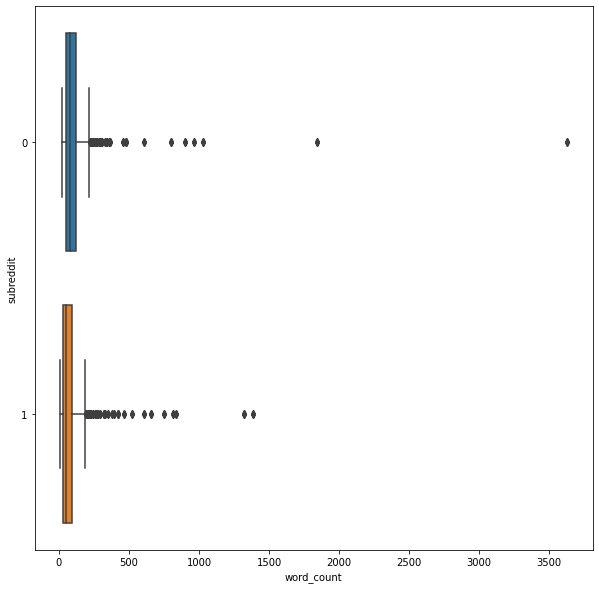

In [80]:
plt.figure(figsize=(10, 10))
sns.boxplot(x=combined['word_count'], y=combined['subreddit'], orient = "h")
plt.show()

- Lots of outliers
- NBA and EPL’s interquartile range are pretty similar
- NBA and EPL’s actual range are very different due to outliers


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


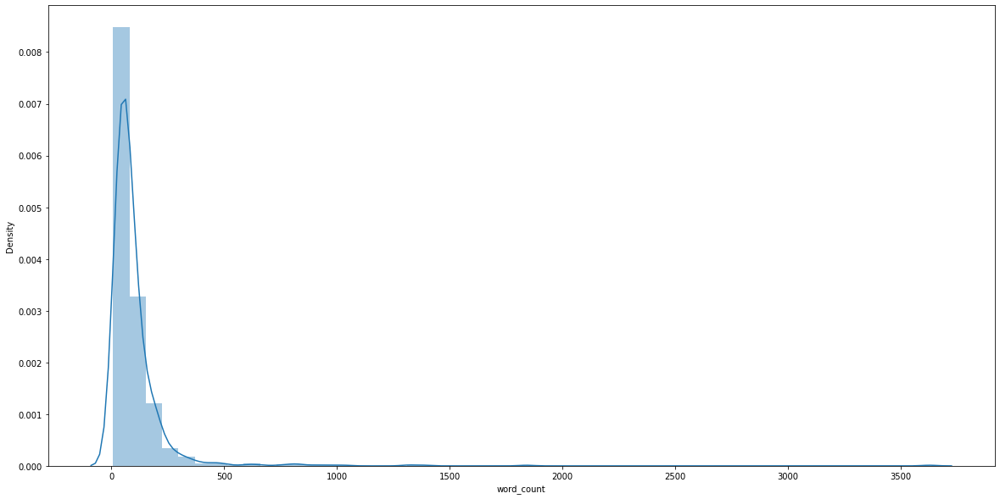

In [88]:
plt.figure(figsize=(20,10))
ax = sns.distplot(combined['word_count'])


**Distribution**
- Right skew
- Unimodal
- Majority of words only appears a few times


Clearly, there are way too many outliers to be able to observe what is going on. 
Thus, we plot the boxplot again, but this time without outliers

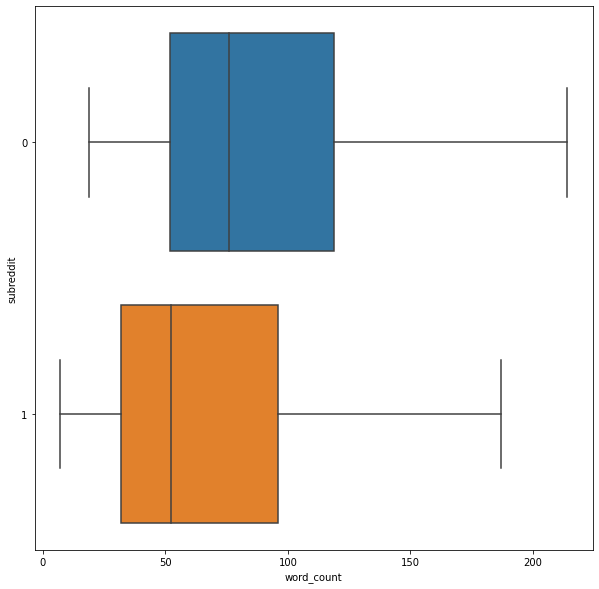

In [81]:
#boxplot without outliers
plt.figure(figsize=(10, 10))
sns.boxplot(x=combined['word_count'], y=combined['subreddit'], showfliers = False, orient = "h")
plt.show()

- NBA has higher interquartile range than EPL
- NBA has higher range than EPL (without factoring outliers)


## Sentiment Analysis

We create our own function to evaluate the all_text column and evaluate the positive, negative, neutral, and compound score.

The compound score is computed by summing the valence scores of each word in the lexicon, adjusted according to the rules, and then normalized to be between -1 (most extreme negative) and +1 (most extreme positive). This is the most useful metric to find a single unidimensional measure of sentiment for a given sentence.

In [60]:
sia = SentimentIntensityAnalyzer()

In [61]:
sia_table = []
for i in combined['all_text']:
    sia_scores = {}
    sia_scores['sia_positive'] = sia.polarity_scores(i)['pos']
    sia_scores['sia_negative'] = sia.polarity_scores(i)['neg']
    sia_scores['sia_neutral'] = sia.polarity_scores(i)['neu']
    sia_scores['sia_compound'] = sia.polarity_scores(i)['compound']
    
    sia_table.append(sia_scores)


In [62]:
sia_table_new = pd.DataFrame(sia_table)

In [63]:
sia_table_new['subreddit'] = 0

In [64]:
sia_table_new['subreddit'][2001:4000] = 1

<ipython-input-64-b297e6aa765a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sia_table_new['subreddit'][2001:4000] = 1


In [65]:
sia_table_new.tail()

,sia_positive,sia_negative,sia_neutral,sia_compound,subreddit
3995,0.104,0.115,0.781,-0.0772,1
3996,0.000,0.000,1.000,0.0000,1
3997,0.199,0.024,0.776,0.9920,1
3998,0.073,0.000,0.927,0.3182,1
3999,0.160,0.092,0.748,0.9190,1


In [66]:
#show the statistics of all the different sentiments
sia_table_new.groupby(['subreddit']).describe().T


subreddit                     0            1
sia_positive count  2001.000000  1999.000000
             mean      0.105288     0.132903
             std       0.074990     0.092750
             min       0.000000     0.000000
             25%       0.043000     0.069000
             50%       0.099000     0.130000
             75%       0.157000     0.186000
             max       0.367000     0.433000
sia_negative count  2001.000000  1999.000000
             mean      0.053297     0.057724
             std       0.055421     0.069586
             min       0.000000     0.000000
             25%       0.000000     0.000000
             50%       0.043000     0.032000
             75%       0.085000     0.100000
             max       0.320000     0.396000
sia_neutral  count  2001.000000  1999.000000
             mean      0.841425     0.809347
             std       0.092853     0.104315
             min       0.589000     0.472000
             25%       0.783000     0.741000
             50%       0.844000     0.805000
             75%       0.911000     0.880000
             max       1.000000     1.000000
sia_compound count  2001.000000  1999.000000
             mean      0.343547     0.343030
             std       0.574290     0.572750
             min      -0.954800    -0.985800
             25%      -0.067200     0.000000
             50%       0.493900     0.509500
             75%       0.855500     0.836000
             max       0.999900     0.999700

### Histogram of sentiment scores

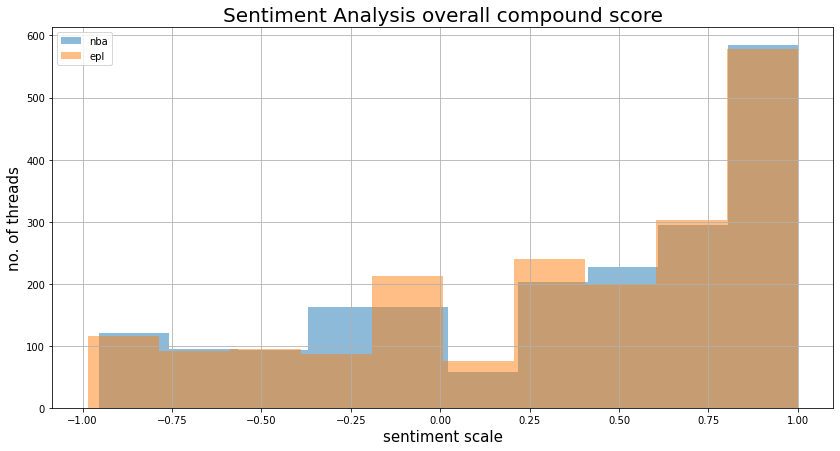

In [67]:
#plot a grraph that shows the overall compound score
fig, ax = plt.subplots(1,1, figsize=(14,7))
sia_table_new.groupby('subreddit')['sia_compound'].hist(alpha=0.5,ax=ax)
ax.legend(['nba', 'epl'])

plt.title('Sentiment Analysis overall compound score', fontsize = 20)
plt.xlabel('sentiment scale', fontsize = 15)
plt.ylabel('no. of threads', fontsize =15)


plt.show()

**Distribution**
- left skewed
- unimodal

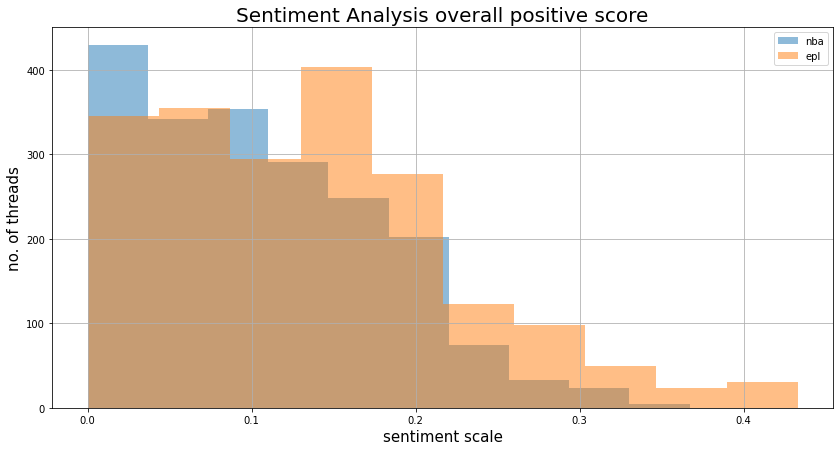

In [68]:
# plot and show the positive sentiment scores
fig, ax = plt.subplots(1,1, figsize=(14,7))
sia_table_new.groupby('subreddit')['sia_positive'].hist(alpha=0.5,ax=ax)
ax.legend(['nba', 'epl'])

plt.title('Sentiment Analysis overall positive score', fontsize = 20)
plt.xlabel('sentiment scale', fontsize = 15)
plt.ylabel('no. of threads', fontsize =15)


plt.show()

**Distribution**
- Negatively sloped graph for both
- EPL has a higher positive sentiment score on average
- Right skewed


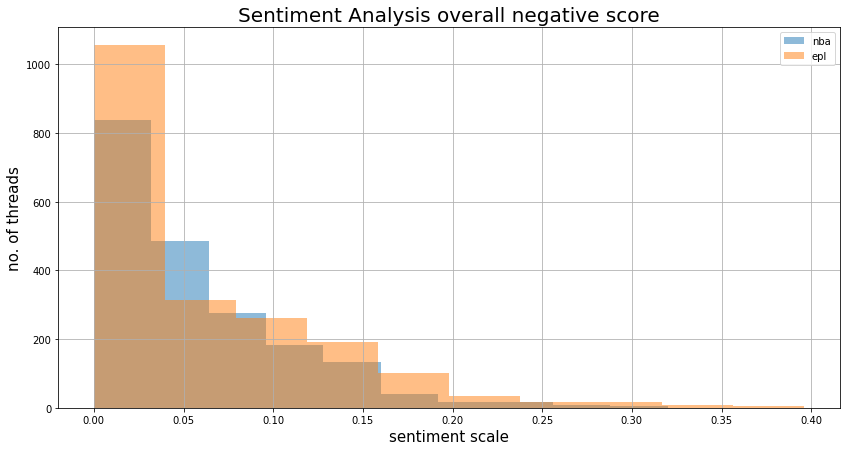

In [69]:
# plot and show the positive sentiment scores
fig, ax = plt.subplots(1,1, figsize=(14,7))
sia_table_new.groupby('subreddit')['sia_negative'].hist(alpha=0.5,ax=ax)
ax.legend(['nba', 'epl'])

plt.title('Sentiment Analysis overall negative score', fontsize = 20)
plt.xlabel('sentiment scale', fontsize = 15)
plt.ylabel('no. of threads', fontsize =15)


plt.show()

**Distribution**
- Negatively sloped graph for both
- EPL has a higher negative sentiment score on average
- Overall distributions are more right skewed than positive sentiment distribution


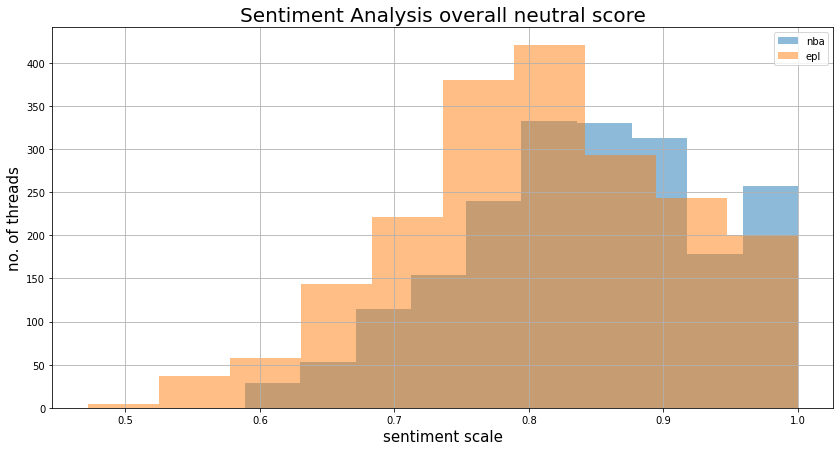

In [70]:
# plot and show the neutral sentiment scores
fig, ax = plt.subplots(1,1, figsize=(14,7))
sia_table_new.groupby('subreddit')['sia_neutral'].hist(alpha=0.5,ax=ax)
ax.legend(['nba', 'epl'])

plt.title('Sentiment Analysis overall neutral score', fontsize = 20)
plt.xlabel('sentiment scale', fontsize = 15)
plt.ylabel('no. of threads', fontsize =15)


plt.show()

**Distribution**
- Left skewed
- Unimodal
- EPL words tend to be more neutral than NBA words



## Identifying Common Terms in Text Data

In [71]:
from sklearn.feature_extraction.text import CountVectorizer


vectorizer = CountVectorizer(stop_words='english')
common_terms = vectorizer.fit_transform(combined['all_text'])
common_vocab = vectorizer.vocabulary_

# {u'blue': 0, u'sun': 3, u'bright': 1, u'sky': 2}


In [89]:
common_vocab

{'trash': 7910,
 'talk': 7591,
 'thursday': 7767,
 'game': 2842,
 'thread': 7745,
 'index': 3652,
 'threads': 7746,
 'january': 3832,
 'tipoffgdtawayhomestatuspgt': 7801,
 'pm': 5757,
 'etphiladelphia': 2382,
 'ersrsixersgt': 2351,
 'ltbrooklyn': 4437,
 'netsrgonetsfinallinkhttpswwwredditcomrnbacommentsksprqgame_thread_philadelphia_ers__brooklyn_netslinkhttpswwwredditcomrnbacommentskstkkipost_game_thread_the_brooklyn_nets__defeat_the': 5123,
 'etcleveland': 2374,
 'cavaliersrclevelandcavsgt': 1117,
 'ltmemphis': 4442,
 'grizzliesrmemphisgrizzliesfinallinkhttpswwwredditcomrnbacommentsksqcpkgame_thread_cleveland_cavaliers__memphislinkhttpswwwredditcomrnbacommentskstunpost_game_thread_the_cleveland_cavaliers_': 3039,
 'etdallas': 2375,
 'mavericksrmavericksgt': 4614,
 'ltdenver': 4438,
 'nuggetsrdenvernuggetsfinalotlinkhttpswwwredditcomrnbacommentskssjrgame_thread_dallas_mavericks__denver_nuggets_linkhttpswwwredditcomrnbacommentskswdpostgame_thread_the_dallas_mavericks__defeat': 5236,
 'e

In [90]:
#top 5 common vocab words
for key in sorted(common_vocab, reverse=True)[:10]:
    print (key, common_vocab[key])


özils 8633
özil 8632
zubeldia 8631
zubac 8630
zouma 8629
zooming 8628
zone 8627
ziyech 8626
zion 8625
zhaire 8624


### Observations:
- Within the top 10, most of the vocab are football players names such as ozils, zubeldia
- Only two words are not names, Both are technical/ specialised words: zone, zooming


### Insights from Problem Statement:
- While the EDA does not directly answer the problem statement, it shares as additional insights to the type of advertising message that should be aimmed at each demographics (i.e nba vs epl fans).
- EPL fans seem to have more positive sentiments than NBA fans, thus the advertising messages directed towards them could also be phrased in a more positive manner.
- In general, negatively worded advertising messages should be avoid since the negative sentiments on both subreddits seem to be minimal.
- Given the pervalence of atheletes or players in the subreddit, perhaps hiring such players as the spokesperson would also be an effective way to connect with the fans.
- Another insight is that advertising messages should be kept to between 52 to 119 words for NBA ads, and 32 to 96 words for EPL ads as this is inline with the interquartile range of the word count.



